# Aprendizaje Automático - Trabajo Práctico
## Profesores
* Joel Spak
* Augstín Almada
* Bruno Cocitto López
## Alumnos
* Ezequiel Arévalo
* Simón Revello

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
import os
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import r2_score, mean_squared_error

from imblearn.over_sampling import SMOTE

from config import CSV_DATA_SOURCE, LOG_LEVEL
from libs.datasets.BaseDataset import BaseDataset

In [2]:
base_dataset = BaseDataset()
base_dataset.load_csv(CSV_DATA_SOURCE)

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145407,145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No,0.0
145408,145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,0.0
145409,145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,0.0
145410,145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,0.0


# Análisis Descriptivo

## Entendiendo el Dataset y los tipos de datos

In [3]:
print(base_dataset.df.info())
print("-----------------------------------")
print(base_dataset.df.describe())
print("-----------------------------------")
print(base_dataset.df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145412 entries, 0 to 145411
Data columns (total 25 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        145412 non-null  int64  
 1   Date              145412 non-null  object 
 2   Location          145412 non-null  object 
 3   MinTemp           143928 non-null  float64
 4   MaxTemp           144159 non-null  float64
 5   Rainfall          142152 non-null  float64
 6   Evaporation       82658 non-null   float64
 7   Sunshine          75616 non-null   float64
 8   WindGustDir       135096 non-null  object 
 9   WindGustSpeed     135159 non-null  float64
 10  WindDir9am        134850 non-null  object 
 11  WindDir3pm        141186 non-null  object 
 12  WindSpeed9am      143645 non-null  float64
 13  WindSpeed3pm      142351 non-null  float64
 14  Humidity9am       142759 non-null  float64
 15  Humidity3pm       140907 non-null  float64
 16  Pressure9am       13

Nos quedamos con las localidades que corresponden para el trabajo práctico e imprimimos los campos del dataset para entenderlo mejor.

In [4]:
base_dataset.df.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
base_dataset.df.drop("Unnamed: 0", axis=1, inplace=True)

## Valores Nulos
<p>Graficamos la dispersion de los valores nulos en un mapa de calor.</p>
<p>Detectamos que casi el 35% de nuestro dataset tiene filas con valores nulos por lo que hacer un dropna() no es una buena opcion.</p>

In [5]:

print( f"Total rows: {base_dataset.df.shape[0]} | Total nulls: {base_dataset.get_amount_of_rows_with_missing_vals()} | {base_dataset.get_percent_of_row_with_missing_vals()}% of null values ")

Total rows: 15986 | Total nulls: 5525 | 34.56149130489178% of null values 


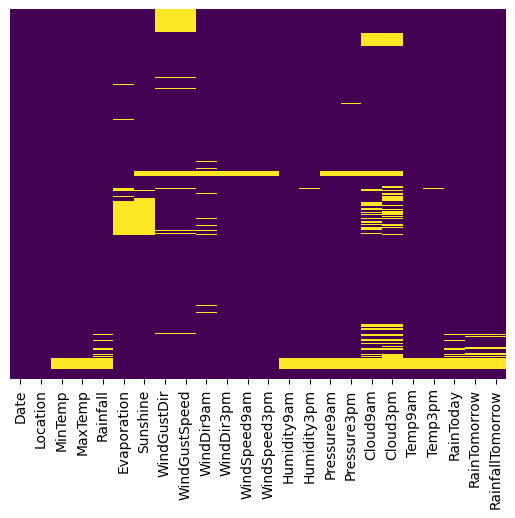

In [6]:
base_dataset.plot_nulls()

## Tratamiento de los valores nulos
---

<p> Guardmos las filas donde las variables dependientes tienen valor nulos </p>


In [7]:
null_rows_for_yy = base_dataset.df.loc[ base_dataset.df['RainTomorrow'].isnull() | base_dataset.df['RainfallTomorrow'].isnull() | base_dataset.df['Rainfall'].isnull()  ]
base_dataset.df.drop(null_rows_for_yy.index, inplace=True)

### Graficar y entender la distribucion de las variables
---
Primero, trataremos de entender la distribucion del resto de las variables y cómo se ajustan los distintos métodos de interpolación a los datos para completar los valores nulos.



### Interpolar utilizando method='linear'
---
Considerando que los datos representan valores recolectados cronologicamente del clima para fechas consecutivas, se deberia tener un comportamiento ciclico en el valores de las variables, al menos en las de temperatura.

Se puede deducir que que la interpolacion lineal no generara un muy buen resultado para completar los valores nulos faltantes debido a que no se ajusta bien a un comportamiento ciclico.

A continuación, se muestran como se reemplazan los valores nulos en el conjunto de datos, demostrando que la interpolación 'linear' no es un metodo efectivo para interporlar este tipo de datos.

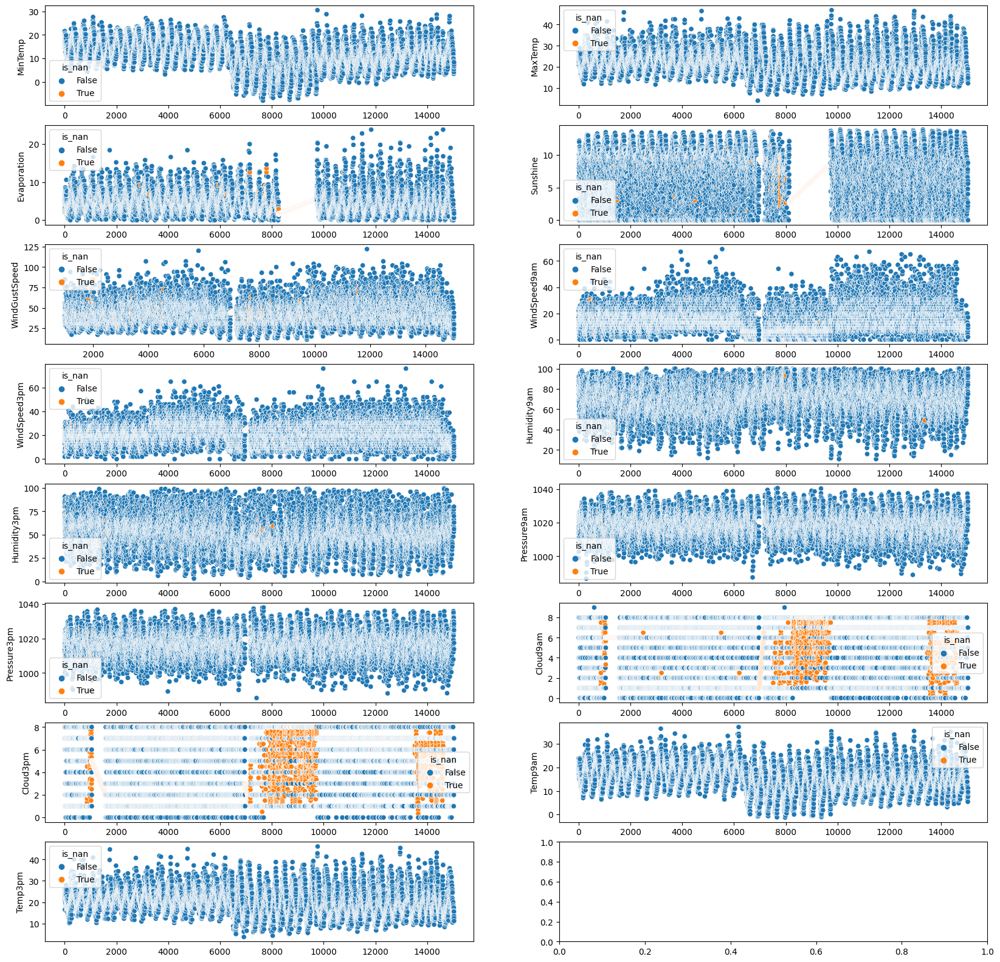

In [8]:
cols = ['MinTemp','MaxTemp','Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm' ]

cols_to_interpolate = cols.copy()

base_dataset.plot_interpolated_scatter(cols, fsize=(20,20))

## Interpolacion metodo nearest
---

Vemos que el metodo "nearest" se ajusta bien para la variables cloud9am y cloud3pm, pero no es muy efectivo para completar nulos donde la brecha entre valores consecutivos es muy grande.

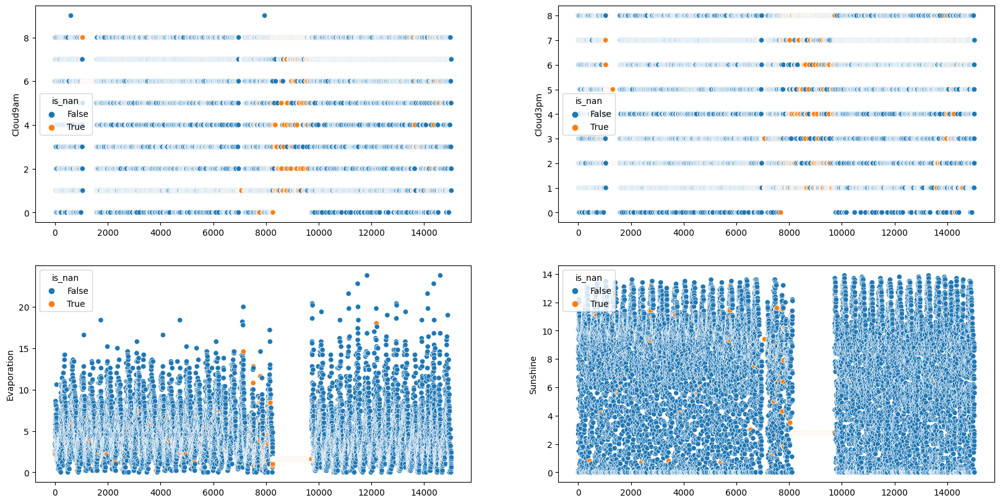

In [9]:

base_dataset.plot_interpolated_scatter(["Cloud9am", "Cloud3pm", "Evaporation","Sunshine"], method="nearest", fsize=(20,10))

<p> Interpolamos utilizanod nearest para Cloud9am y Cloud3pm </p>

Cloud9am valores nulos : 0
Cloud3pm valores nulos : 0


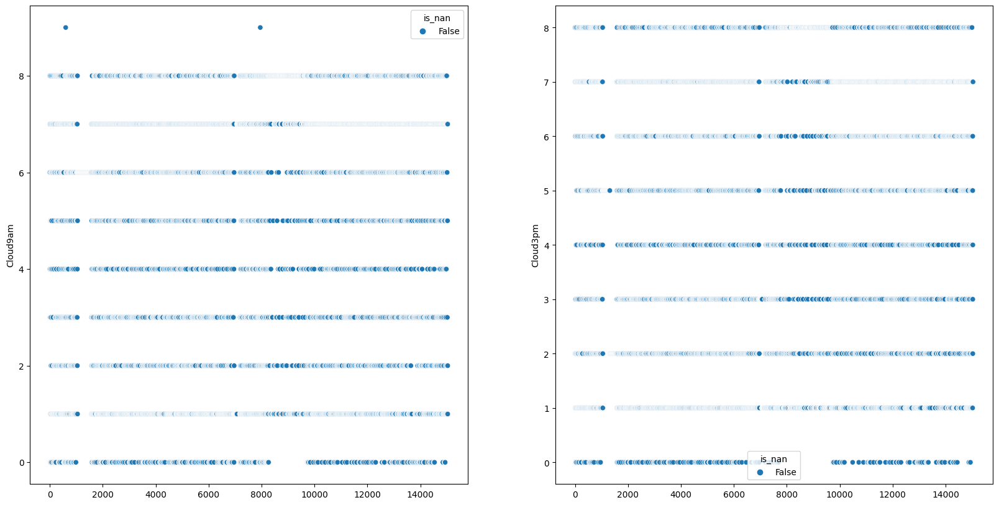

In [10]:
for col in ["Cloud9am", "Cloud3pm"]:
    base_dataset.df[col].interpolate(method="nearest", inplace=True)
    print( f"{col} valores nulos : {base_dataset.df[col].isnull().sum()}")

base_dataset.plot_interpolated_scatter(["Cloud9am", "Cloud3pm"], method="nearest", fsize=(20,10))
cols_to_interpolate = [col for col in cols_to_interpolate if col not in ["Cloud9am", "Cloud3pm"]]

## Interpolacion Polinomica
---


### Interpolar utilizando method='cubicspline'
<p>Intentamos a continuación inteporlar utilizando distintos métodos polinómicos para intentar conseguir un mejor ajuste para la interpolacion, </p>
<p>pero para grandes brechas entre datos los modelos polinómicos no se ajustan bien. </p>
<p> Por lo que interpolacion mediante metodos polinomicos es la peor opción de todas las analizadas hasta ahora, incluso intentando métodos de órden de diferente exponentes.</p>

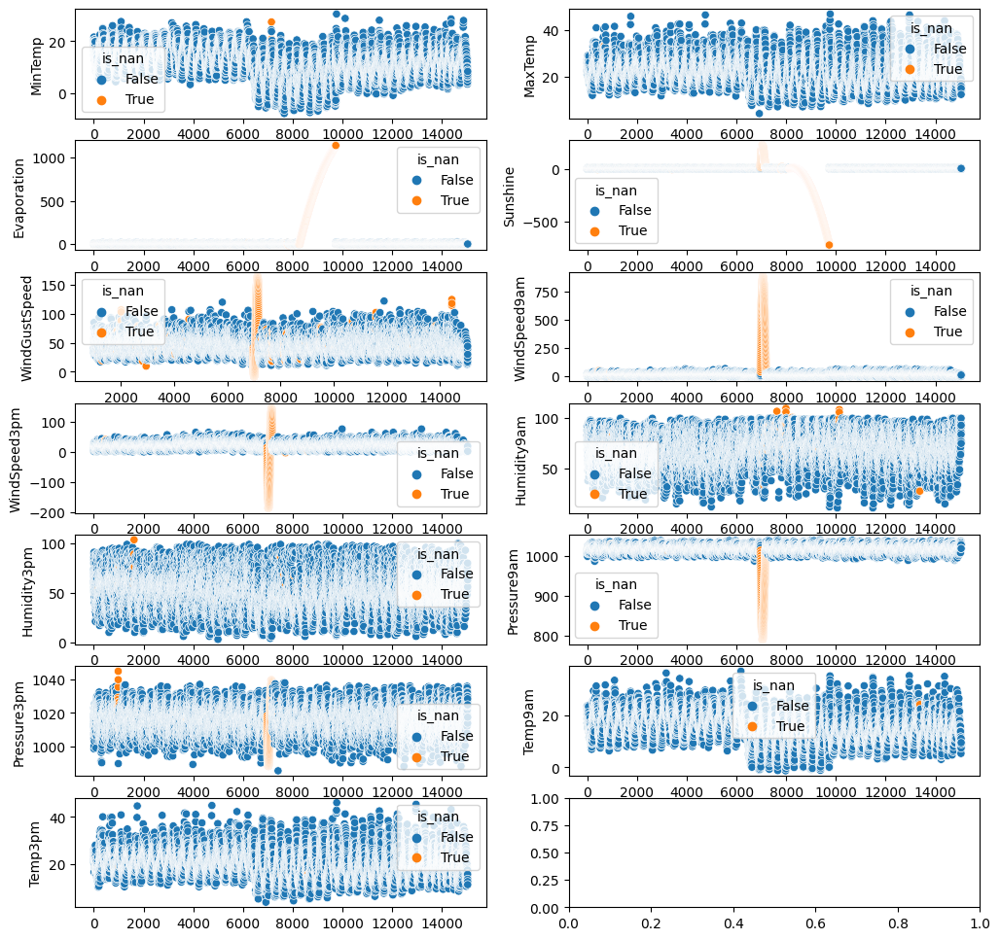

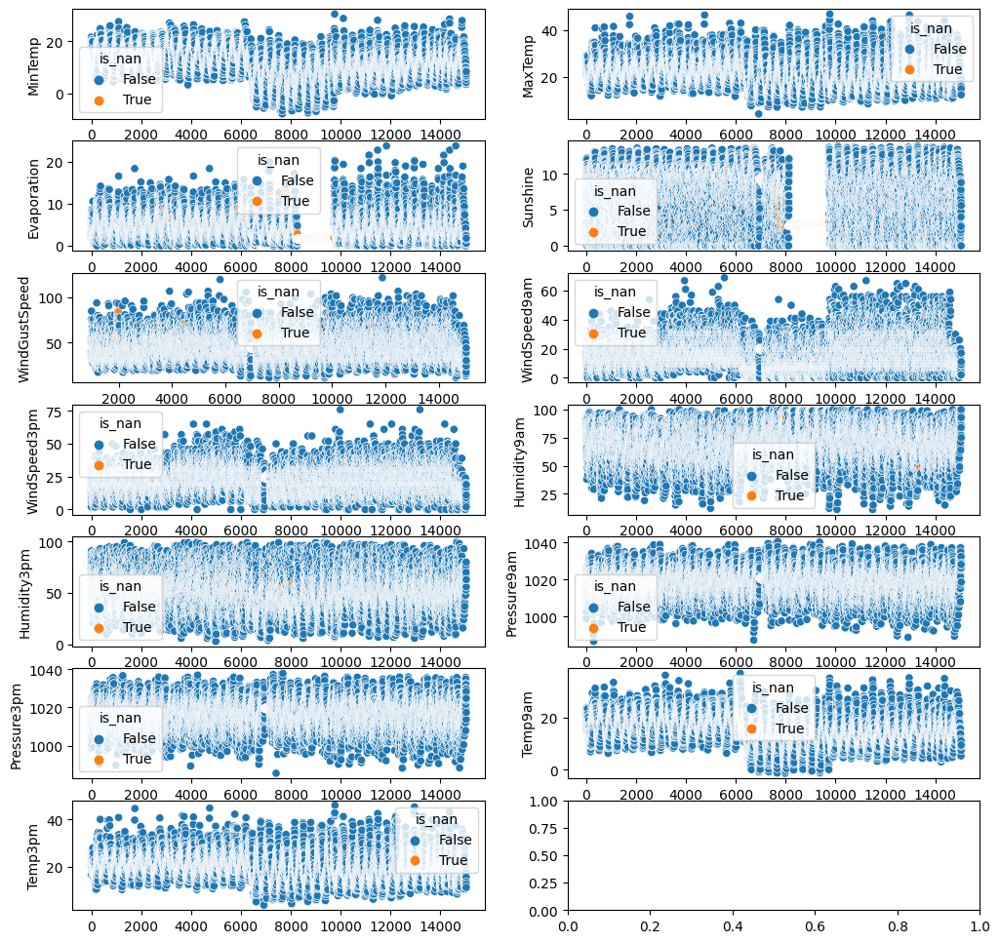

In [11]:
base_dataset.plot_interpolated_scatter(cols_to_interpolate, method="cubicspline")
base_dataset.plot_interpolated_scatter(cols_to_interpolate, method="polynomial", order=1)

Ninguno de estos metodos nos sirve para interporlar los valores sin perder demasiada informacion, por lo que vamos a intentar realizar una regresion lineal para los distintos campos para completar sus valroes.

<p> Vamos a intentar realizar distintos modelos para poder completar los valores nulos del dataset original. </p>
<p> Para ello vamos a eliminar los valores nulos del dataset, lo que nos llevara a usar el 65% del dataset original, pero vamos a generar datos aproximados mas precisos para interpolar. </p>


## Generar encodings para variable categoricas no numericas
---


<p> Vamos a generar un nuevo dataset para usar para la interpolacion. </p>
<p> Pero primero vamos a generar el encoding de las variables en el dataset original para no repetir este proceso dos veces</p>

### Encoding de la variable Date
<p> Se consideraron de formas de realizar el encoding de la variable fecha uno generando dummy variables y la otra usando transformacion de sine/coseno.</p>
<p> Descartamos el encoding utilizando dummy variables ya que el modelo creceria mucho en tamano en termino de variables explicativas.</p>
<p> Teniendo en cuenta que estamos evaluando el clima, el cual empiricamente sabemos que posee comportamiento ciclico, se procede a utilizar los dias del ano como referencia temporal y se aplica transformacion de coseno como se detalla a continuacion.</p>


In [12]:
base_dataset.df['Date']= pd.to_datetime(base_dataset.df['Date'])
base_dataset.df['Month']= base_dataset.df['Date'].dt.month
base_dataset.df['DayOfYear']= base_dataset.df['Date'].dt.day_of_year

base_dataset.df["Month"].value_counts().sort_index()
base_dataset.df["DayOfYear"].value_counts().sort_index()

DayOfYear
1      44
2      45
3      44
4      44
5      44
       ..
362    38
363    38
364    38
365    37
366     8
Name: count, Length: 366, dtype: int64

/tmp/ipykernel_15988/2862107064.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["month_sin"] = base_dataset.sin_transformer(12).fit_transform(df)["Month"]
/tmp/ipykernel_15988/2862107064.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["month_cos"] = base_dataset.cos_transformer(12).fit_transform(df)["Month"]
/tmp/ipykernel_15988/2862107064.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

Text(0.5, 0.98, 'Cyclical encoding with sine/cosine transformation')

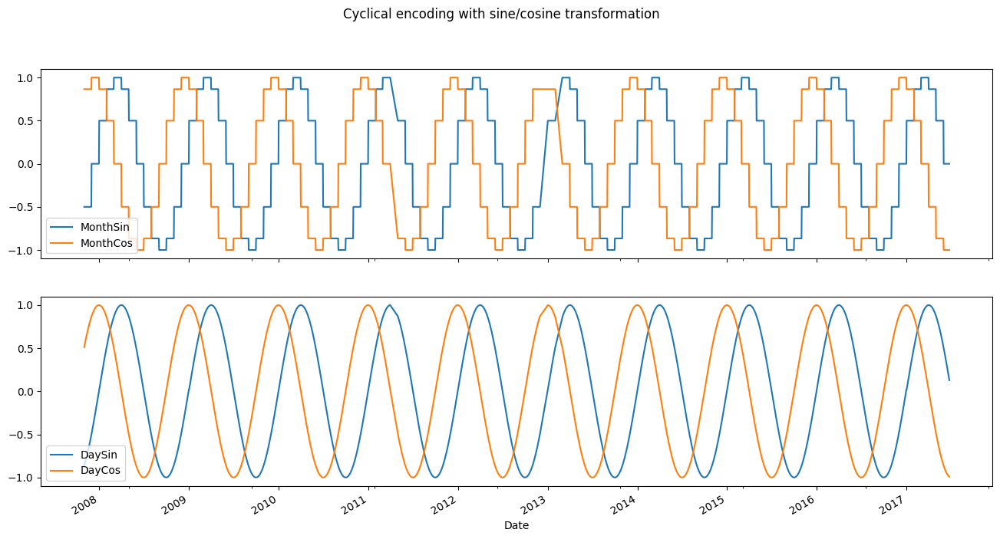

In [13]:
# Generamos un dataset temporal para poder hacer la transformación

df = base_dataset.df[["Month","DayOfYear"]]

df["month_sin"] = base_dataset.sin_transformer(12).fit_transform(df)["Month"]
df["month_cos"] = base_dataset.cos_transformer(12).fit_transform(df)["Month"]

df["day_sin"] = base_dataset.sin_transformer(365).fit_transform(df)["DayOfYear"]
df["day_cos"] = base_dataset.cos_transformer(365).fit_transform(df)["DayOfYear"]

# Añadimos las columnas al dataset original y graficamos el resultado
base_dataset.df[["MonthSin","MonthCos","DaySin","DayCos"]] = df[["month_sin","month_cos","day_sin","day_cos"]]
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(16,8))
base_dataset.df[["MonthSin","MonthCos","Date"]].plot(ax=ax[0], x="Date")
base_dataset.df[["DaySin","DayCos","Date"]].plot(ax=ax[1], x="Date")
plt.suptitle("Cyclical encoding with sine/cosine transformation")

<p> Nos quedaramos con la transformacion de coseno de los dias del ano </p>

In [14]:
[ base_dataset.df.drop( col, axis=1, inplace=True) for col in ["MonthSin","MonthCos","DaySin","Month","DayOfYear", "Date"] ]


[None, None, None, None, None, None]

### Enconding para las variables explicativas

<p> Para variables Yes/No como RainToday and RainTomorrow generamos encoding binarios asignando 1 y 0 respectivamente. </p>
<p> Para variables que describen las direcciones del viento, las colapsamos en 4 valores N,S,W y E y se generaron valores dummies. </p> 
<p> Se realiza un planteo si Location deberia simplificarse y colapsar las zonas mas cercanas, pero un modelo real, por lo que se unificaran Sydney con SydneyAirport y Melbourne con MelbourneAirport.
Se generan los dummy encodings para esta categoria.</p>

In [15]:
base_dataset.df.Location.value_counts()

Location
Canberra            3401
Sydney              3330
MelbourneAirport    3008
SydneyAirport       3000
Melbourne           2297
Name: count, dtype: int64

In [16]:
base_dataset.df.Location.replace({'SydneyAirport': "Sydney", 'MelbourneAirport': "Melbourne"}, inplace=True)
print( base_dataset.df.Location.value_counts() )
one_hot_encoding=pd.get_dummies(base_dataset.df.Location, dtype=int)
print(one_hot_encoding.columns)
base_dataset.df.drop("Location", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)


Location
Sydney       6330
Melbourne    5305
Canberra     3401
Name: count, dtype: int64
Index(['Canberra', 'Melbourne', 'Sydney'], dtype='object')


In [17]:
from sklearn.preprocessing import LabelEncoder

cardinal_points_map = {
    "N" : "^N.*$",
    "S" : "^S.*$",
    "W" : "^W.*$",
    "E" : "^E.*$"
}

for k,v in cardinal_points_map.items():
    base_dataset.df.WindGustDir.replace( to_replace=v, value=k, regex=True, inplace=True)
    base_dataset.df.WindDir3pm.replace( to_replace=v, value=k, regex=True, inplace=True)
    base_dataset.df.WindDir9am.replace( to_replace=v, value=k, regex=True, inplace=True)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindGustDir, dtype=int, prefix="WindGustDir_")
base_dataset.df.drop("WindGustDir", axis=1, inplace=True)
base_dataset.df= base_dataset.df.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindDir9am, dtype=int,  prefix="WindDir9am_")
base_dataset.df.drop("WindDir9am", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindDir3pm, dtype=int,  prefix="WindDir3pm_")
base_dataset.df.drop("WindDir3pm", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)

le = LabelEncoder()
base_dataset.df["RainToday"] = le.fit_transform(base_dataset.df.RainToday)
base_dataset.df["RainTomorrow"] = le.fit_transform(base_dataset.df.RainTomorrow)
base_dataset.df


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindGustDir__S,WindGustDir__W,WindDir9am__E,WindDir9am__N,WindDir9am__S,WindDir9am__W,WindDir3pm__E,WindDir3pm__N,WindDir3pm__S,WindDir3pm__W
30167,19.5,22.4,15.6,6.2,0.0,NaN,17.0,20.0,92.0,84.0,...,0,0,0,0,1,0,0,0,1,0
30168,19.5,25.6,6.0,3.4,2.7,NaN,9.0,13.0,83.0,73.0,...,0,0,0,0,0,1,1,0,0,0
30169,21.6,24.5,6.6,2.4,0.1,NaN,17.0,2.0,88.0,86.0,...,0,0,1,0,0,0,1,0,0,0
30170,20.2,22.8,18.8,2.2,0.0,NaN,22.0,20.0,83.0,90.0,...,0,0,0,1,0,0,1,0,0,0
30171,19.7,25.7,77.4,NaN,0.0,NaN,11.0,6.0,88.0,74.0,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70366,6.4,15.8,0.0,2.4,8.8,39.0,11.0,17.0,84.0,56.0,...,0,0,0,1,0,0,0,1,0,0
70367,7.8,13.5,0.6,0.6,0.0,24.0,2.0,9.0,100.0,80.0,...,0,0,0,0,0,1,0,0,1,0
70368,6.7,14.1,0.2,0.6,0.0,24.0,9.0,11.0,93.0,56.0,...,0,0,0,1,0,0,0,1,0,0
70369,7.4,14.9,0.0,1.6,6.0,44.0,17.0,19.0,77.0,63.0,...,0,0,0,1,0,0,0,1,0,0


## PCA
---

[1.73976243e-01 1.20168698e-01 1.09739215e-01 7.92941982e-02
 7.57555099e-02 4.98670767e-02 4.18858734e-02 3.69898538e-02
 3.26377063e-02 2.94987147e-02 2.69303637e-02 2.51152395e-02
 2.32765751e-02 1.92153897e-02 1.82863736e-02 1.72376753e-02
 1.51718779e-02 1.46388355e-02 1.37324472e-02 1.22432849e-02
 1.18237207e-02 1.08218214e-02 1.06450641e-02 7.86950732e-03
 7.23258258e-03 5.70305895e-03 4.79182447e-03 2.77638151e-03
 8.94651875e-04 6.51382167e-04 5.89662524e-04 4.28356282e-04
 1.03897531e-04 6.93801735e-06 3.43107640e-32]


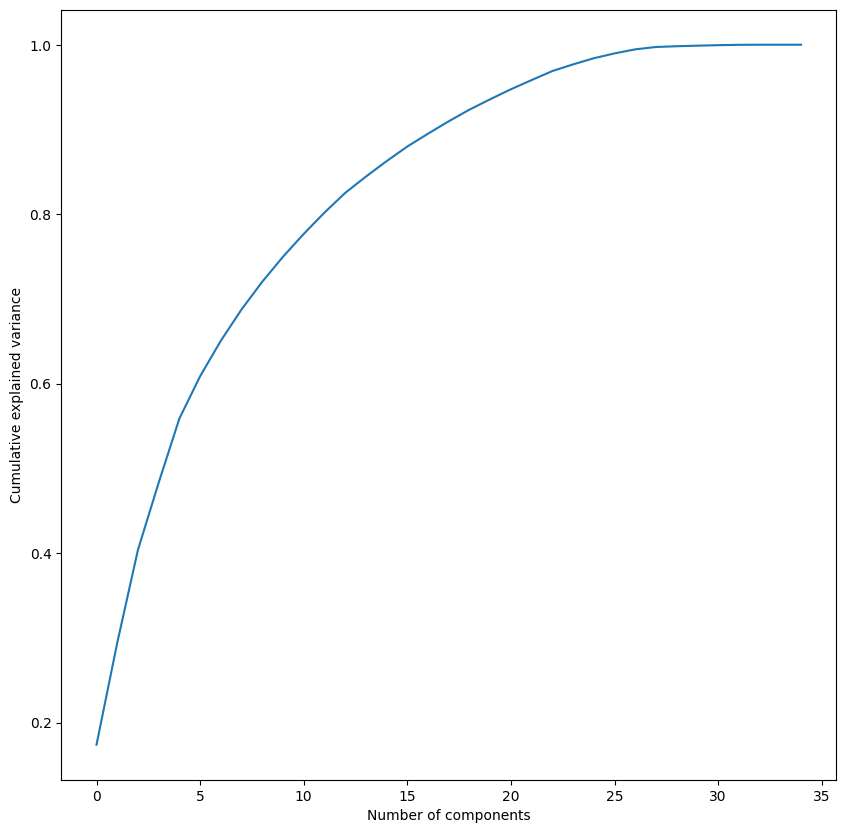

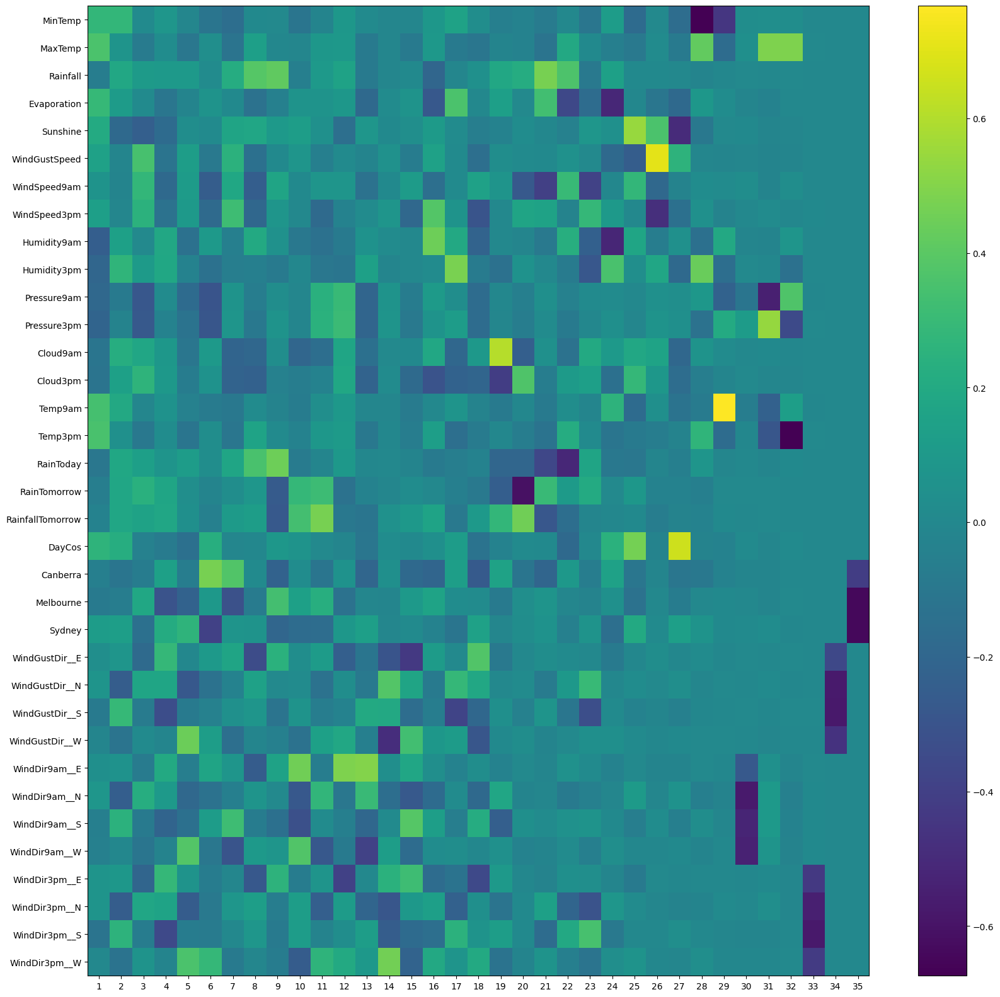

In [18]:
pca = base_dataset.plot_PCA()

### Matriz de correlacion
---

<p> Generamos la matriz de correlacion para entender como se relacionan nuestro variables </p>
<p> Se utilizaran estos datos para generar los mejores datos posibles para completar los valores nulos de nuestras features </p>

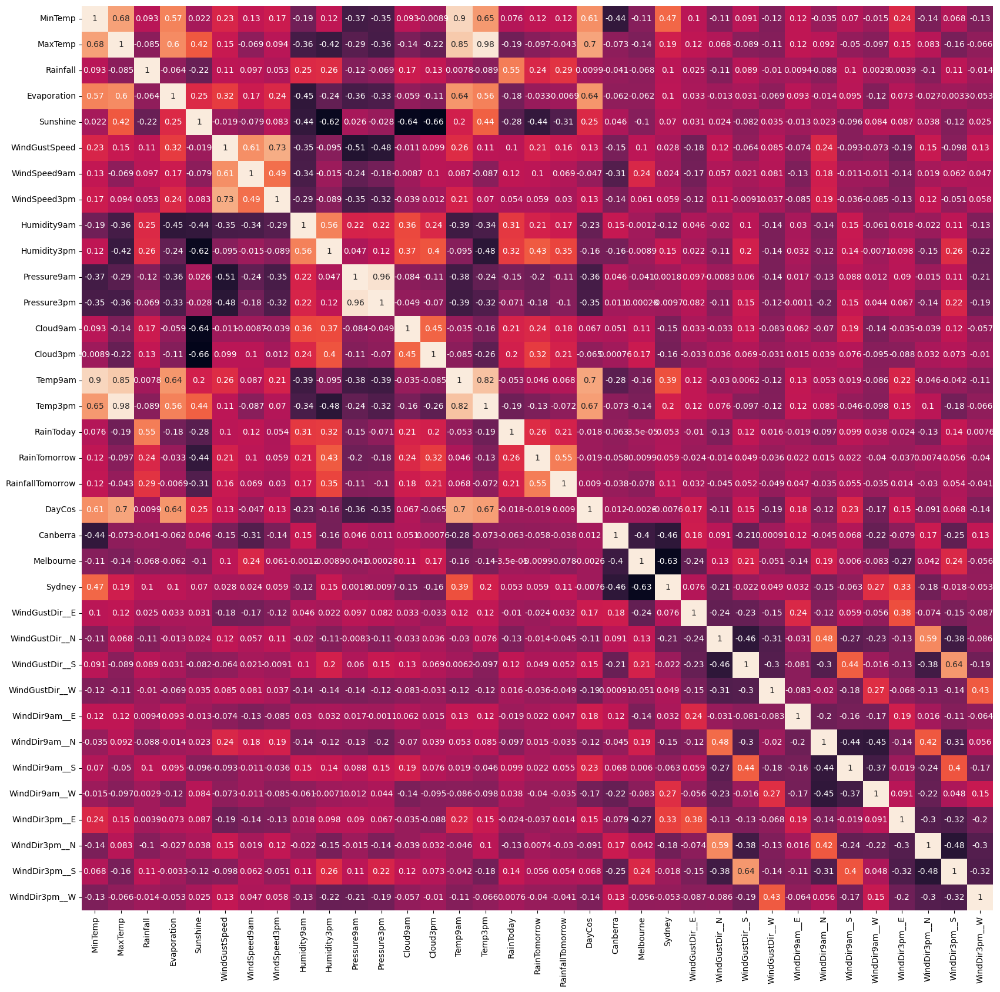

In [19]:
#base_dataset.plot_correlation()
base_dataset.df.columns
base_dataset.plot_correlation(figsize=(20,20))

# Primera conclusion
---

<p> Viendo que la varianza acumalada en PCA supera al menos el 85% de su varianza con casi 20 variables y que viendo que en la matriz de correlacion no se encuentra fuerte correlacion entre las diferentes variables independientes, podemos presumir que los modelos lineales no seran muy efectivos con nuestro dataset.</p>
</p> Procedemos a borrar las variables extremadamente correlacionadas como MaxTemp y MinTemp dejando Temp9am y Temp3pm para simplificar un poco mas nuestro dataset. </p>

In [20]:
base_dataset.df.drop(["MinTemp", "MaxTemp"], inplace=True, axis=1)

## Regresion Lineal sobre variables explicativas
---

### Funcion de prediccion para interpolacion de features
---

In [21]:
def predict_interpolation_values(df : pd.DataFrame, x_cols : list["str"], y_cols : list["str"]):
    results : list = []

    for y_col in y_cols:
        temp_interpolation = BaseDataset()
        temp_interpolation.df = base_dataset.df.copy()

        print( "Total nulls for evaporation : ", temp_interpolation.df[y_col].isnull().sum())
        x_pred, x_train, x_test, y_train, y_test = temp_interpolation.split_dataset( x_train_cols=x_cols, y_train_col=y_col, test_size=0.2, shuffle_ds=False)
        model, y_pred, r2, mse = temp_interpolation.linear_regresion()
        print( "Total nulls predicted: ",len(x_pred))
        y_pred = temp_interpolation.linear_prediction(x_pred=x_pred)
        x_pred[y_col] = y_pred
        print(f"R2: {r2} | MSE: {mse}")
        results.append( (x_pred, r2, mse) )
    return results


<p> Creamos un dataset temporal nuevo para poder los valores sin afectar el dataset original </p>

### Variable  Sunshine
---
<p> Usaremos las variables correlacionadas para interpolar utilizando un modelo lineal para interpolar los datos </p>
<p> Vemos que un R2 de 0.7 generamos muchos mejores resultados que utilizando metodos de interpolacion provistos por pandas </p>

In [22]:
temp_interpolation_cols_x = ["Temp3pm", "Cloud9am", "Cloud3pm","Humidity9am","Humidity3pm","DayCos"]
temp_interpolation_cols_y = ["Sunshine"]

x_pred, r2, mse = predict_interpolation_values(base_dataset.df, temp_interpolation_cols_x, temp_interpolation_cols_y)[0]
    

Total nulls for evaporation :  1931
Total nulls predicted:  1912
R2: 0.6626637550668042 | MSE: 5.18852784911513


<p> Actulizamos el dataframe original con los datos predichos y graficamos la interpolacion para asegurarnos de que se ajusto bien a los datos obtenidos </p>
<p> Graficamos para comparar las diferencia entre interpolar usando pandas y utilizando el modelo lineal generado </p>

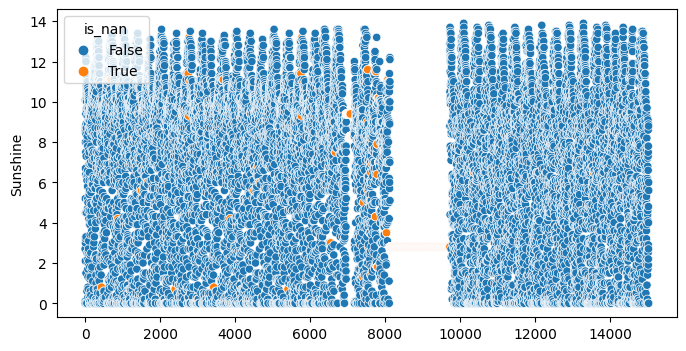

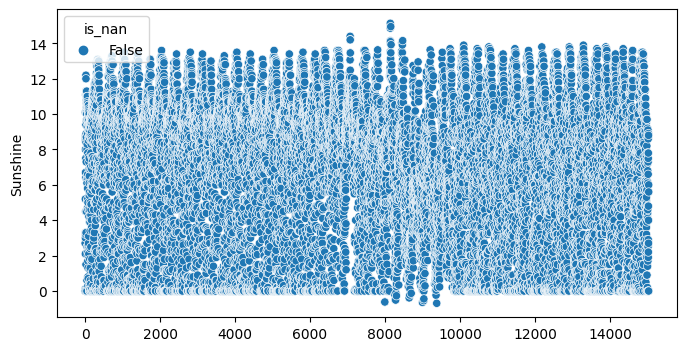

In [23]:
base_dataset.plot_interpolated_scatter(["Sunshine"], method="nearest", sy=1, fsize=(8,4))
base_dataset.df.update(x_pred["Sunshine"], errors="raise")
base_dataset.df["Sunshine"].isnull().sum()
base_dataset.df["Sunshine"].interpolate(method="nearest", inplace=True)
base_dataset.plot_interpolated_scatter(["Sunshine"],sy=1, fsize=(8,4))


<p> Notamos que todavia quedan algunos valores nulos, por lo que procedemos ahora si a interpolarlos con el metodo "nearest" ya que no existen brechas grandes entre los datos.</p>
<p> Vemos ademas que le regresion lineal genero algunos valores menores a 0 y mayores al maximo del dataset original, por lo que procedemos a ajustarlos tambien </p>

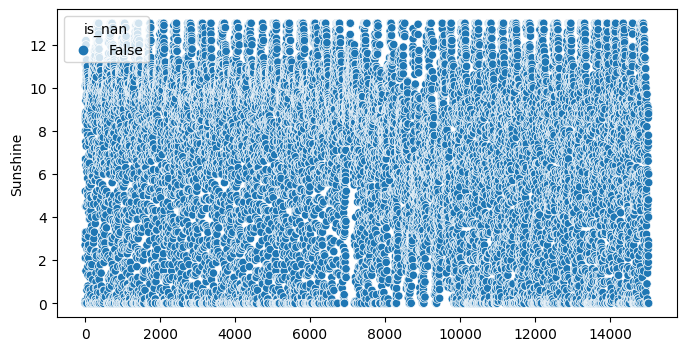

Datos nulos para la variable Sunshine: 0


In [24]:
base_dataset.df["Sunshine"] = base_dataset.df["Sunshine"].apply(lambda value: value if value >0 else 0 )
base_dataset.df["Sunshine"] = base_dataset.df["Sunshine"].apply(lambda value: value if value <=13 else 13 )
base_dataset.plot_interpolated_scatter(["Sunshine"],sy=1, fsize=(8,4))
sunshine_nulls = base_dataset.df["Sunshine"].isnull().sum()
print( f"Datos nulos para la variable Sunshine: {sunshine_nulls}")

### Interpolando Evaporation
---
<p> Siguiendo el mismo metodo utilizamos un modelo lineal para predecir datos nulos de evaporacion. </p>
<p> Utilizamos las variables Temp9am, Temp3pm, Humidity9am, DayCos, Pressure9am, Pressure3pm </p>

In [25]:
temp_interpolation_cols_x = ["Temp9am", "Temp3pm", "Humidity9am","Humidity3pm", "Pressure9am", "Pressure3pm", "DayCos"]
temp_interpolation_cols_y = ["Evaporation"]

x_pred, r2, mse = predict_interpolation_values(base_dataset.df, temp_interpolation_cols_x, temp_interpolation_cols_y)[0]


Total nulls for evaporation :  1681
Total nulls predicted:  1664
R2: 0.5716066055856395 | MSE: 4.78135142757982


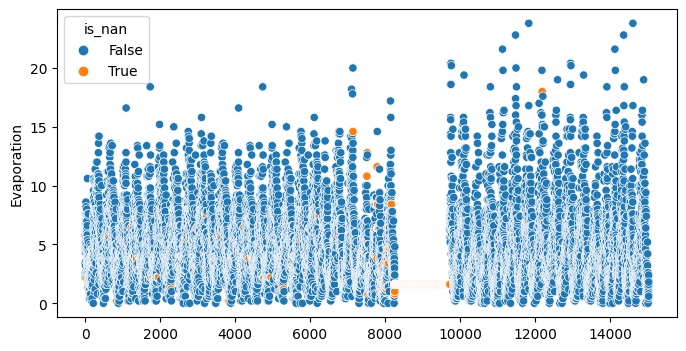

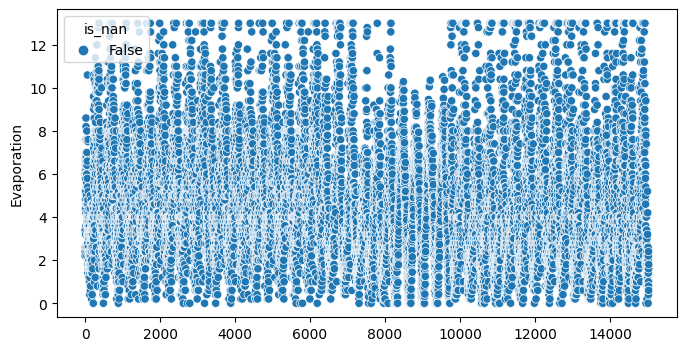

Datos nulos para la variable Evaporation: 0


In [26]:
base_dataset.plot_interpolated_scatter(["Evaporation"], method="nearest", sy=1, fsize=(8,4))
base_dataset.df.update(x_pred["Evaporation"], errors="raise")
base_dataset.df["Evaporation"].isnull().sum()
base_dataset.df["Evaporation"].interpolate(method="nearest", inplace=True)
# Evaporation tiene valores negativos predichos por el modelo, por lo que los convertimos a 0
base_dataset.df["Evaporation"] = base_dataset.df["Evaporation"].apply(lambda value: value if value >0 else 0 )
base_dataset.df["Evaporation"] = base_dataset.df["Evaporation"].apply(lambda value: value if value <=13 else 13 )
base_dataset.plot_interpolated_scatter(["Evaporation"],sy=1, fsize=(8,4))
sunshine_nulls = base_dataset.df["Evaporation"].isnull().sum()
print( f"Datos nulos para la variable Evaporation: {sunshine_nulls}")


<p> 

## Conclusion de interpolacion y tratamiento de los valores nulos
---

<p> Vemos cuantos filas con valores nulos quedaron en nuestro dataset </p>

In [27]:
print( f"Total rows: {base_dataset.df.shape[0]} | Total nulls: {base_dataset.get_amount_of_rows_with_missing_vals()} | {base_dataset.get_percent_of_row_with_missing_vals()}% of null values ")

Total rows: 15036 | Total nulls: 1575 | 10.474860335195531% of null values 


<p> Vemos que redujimos el numero de filas con valores nules al 10 %. </p>
<p> Considerando que las variables que faltan interpolar estan muy relacionadas entre si, y que comparten el mismo rango del indice donde presentan valores nulos, procedemos a borrarlos con dropna.</p>
<p> Concluimos que es la mejor opcion, ya que los metodos de interpolacion no son para nada buenos y que tenemos suficientes datos para desarrollar los modelos de regresion lineal y logistica previamente </p>

In [28]:
base_dataset.df.dropna(inplace=True)

Dividimos el dataset base, diferentes datasets pata ser trabajados posteriormente cada uno con sus respectivos modelos.

### Viendo distribucion de las variables
---

<p> Graficamos las distribuacion de las variables con respecto a la variable objetivo por ejemplo para la regresion logistica para entender un poco mas el dataset </p>
<p> Vemos que el dataset no esta correctamente balanceado a simple vista, y que hay mayo numeros de dias que no llovio. </p>

<Figure size 640x480 with 0 Axes>

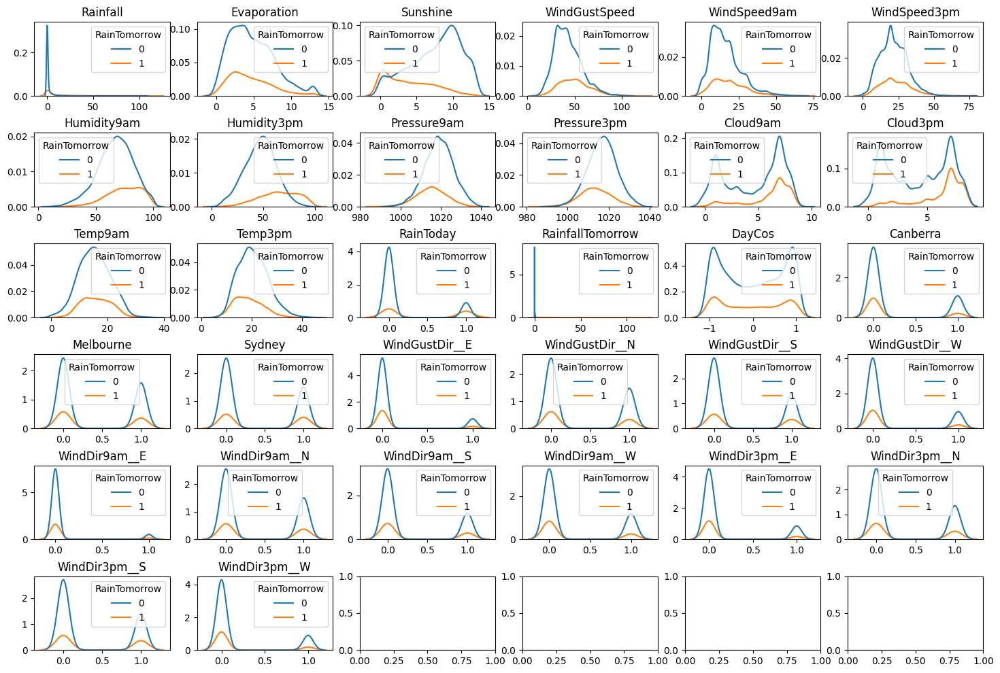

In [29]:
base_dataset.plot_distributions(y_col="RainTomorrow")


## Split datasets
---

<p> Ya con el dataset interpolado, procedemos a generar el split del dataset. </p>
<p> La funcion de split generara un shuffle sobre los datos para ayudar overfitting y sesgo en los modelos y pode realizar mejores predicciones. </p>
<p> Vamos a generar un dataset para cada modelo de regresion. </p>
<p> Borraremos las columnas de cada dataset que podrian introducir ruido y overfitting en nuestros modelos por estar tan altamente correlacionadas.</p>
<p> Usamos

In [30]:
rainfall_ds_linear = BaseDataset()
rainfall_tomorrow_ds_linear = BaseDataset()
rain_today_ds_logistic = BaseDataset()
rain_tomorrow_ds_logistic  = BaseDataset()

rainfall_ds_linear.df = base_dataset.df.copy()
rainfall_tomorrow_ds_linear.df = base_dataset.df.copy()

rain_today_ds_logistic.df = base_dataset.df.copy()
rain_tomorrow_ds_logistic.df = base_dataset.df.copy()

rainfall_ds_linear.df.drop(["RainTomorrow", "RainfallTomorrow", "RainToday"], axis=1, inplace=True)
rainfall_tomorrow_ds_linear.df.drop(["RainTomorrow"], axis=1, inplace=True)

rain_today_ds_logistic.df.drop(["RainTomorrow", "RainfallTomorrow", "Rainfall"], axis=1, inplace=True)
rain_tomorrow_ds_logistic.df.drop(["RainfallTomorrow"], axis=1, inplace=True)

In [31]:
rainfall_ds_linear.split_dataset( x_train_cols=rainfall_ds_linear.df.columns.drop("Rainfall"), y_train_col="Rainfall", test_size=0.2, shuffle_ds=True)
rainfall_tomorrow_ds_linear.split_dataset( x_train_cols=rainfall_tomorrow_ds_linear.df.columns.drop("RainfallTomorrow"), y_train_col="RainfallTomorrow", test_size=0.2, shuffle_ds=True)

rain_today_ds_logistic.split_dataset( x_train_cols=rain_today_ds_logistic.df.columns.drop("RainToday"), y_train_col="RainToday", test_size=0.2, shuffle_ds=True, stratify_y=True)
rain_tomorrow_ds_logistic.split_dataset( x_train_cols=rain_tomorrow_ds_logistic.df.columns.drop("RainTomorrow"), y_train_col="RainTomorrow", test_size=0.2, shuffle_ds=True, stratify_y=True)

print("Datasets splitted")


Datasets splitted


## Normalizando Datasets
---

<p> Procedemos a normalizar los datasets ya divididos en train y tests </p>

<p> Entendiendo las variables objetivos para la regresion lineal</p>

In [32]:
print( f" Rainfall Var :{np.var(rainfall_ds_linear.y_train)} | Min val: {np.min(rainfall_ds_linear.y_train)} | Max val: {np.max(rainfall_ds_linear.y_train)}")
print( f" RainfallTomorrow Var :{np.var(rainfall_tomorrow_ds_linear.y_train)} | Min val: {np.min(rainfall_tomorrow_ds_linear.y_train)} | Max val: {np.max(rainfall_tomorrow_ds_linear.y_train)}")

 Rainfall Var :53.21742704395999 | Min val: 0.0 | Max val: 119.4
 RainfallTomorrow Var :55.55978581002417 | Min val: 0.0 | Max val: 119.4


In [33]:
rainfall_ds_linear.scale_ds(scale_target=True)
rainfall_tomorrow_ds_linear.scale_ds(scale_target=True)
rain_today_ds_logistic.scale_ds(scale_target=False)
rain_tomorrow_ds_logistic.scale_ds(scale_target=False)

print("Datasets scaled")

Datasets scaled


In [34]:
print( f"Scaled Rainfall Var: {np.var(rainfall_ds_linear.y_train)} | Min: {rainfall_ds_linear.y_train.min()} | Max : {rainfall_ds_linear.y_train.max()}" )
print( f"Scaled Rainfall Var: {np.var(rainfall_tomorrow_ds_linear.y_train)} | Min: {rainfall_tomorrow_ds_linear.y_train.min()} | Max : {rainfall_tomorrow_ds_linear.y_train.max()}" )

Scaled Rainfall Var: 1.0 | Min: -0.3086405894215482 | Max : 16.058672499134794
Scaled Rainfall Var: 1.0 | Min: -0.30196109482166006 | Max : 15.71662004352588


## Balanceo de Clases
---

Podemos ver que hay una desproporción en la cantidad de casos de lluvia con los de no lluvia. Si utilizamos el dataset como actualmente está obtendremos un modelo sesgado que tendrá preferencia por los dias de no lluvia. Para esto podemos utilizar diferentes técnicas para mantener el dataset proporcionado:
* Pesos de clase: A la clase LogisticRegression podemos setear el parámetro class_weight a "balanced" para dar más peso a los registros de lluvia
* Submuestreo: Eliminar registros de no lluvia hasta equiparar los de lluvia.
* Sobremuestreo: Generar información sintética para aumetar los registros de lluvia.

RainTomorrow
0    10396
1     3065
Name: count, dtype: int64

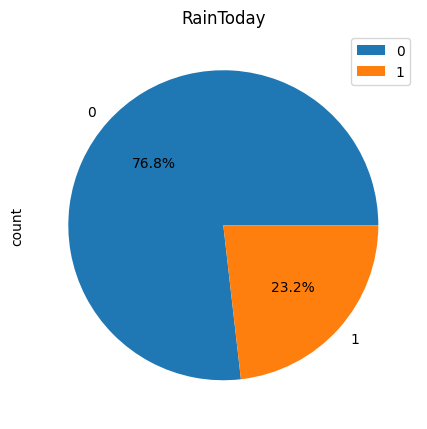

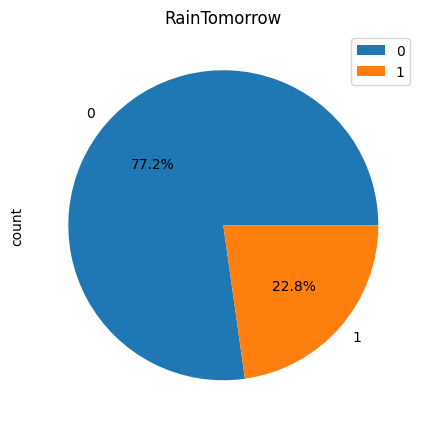

In [35]:
base_dataset.plot_pie_classes("RainToday", title="RainToday", figsize=(5,10), args={ "legend": True, "autopct":'%1.1f%%'})
base_dataset.plot_pie_classes("RainTomorrow", title="RainTomorrow", figsize=(5,10), args={ "legend": True, "autopct":'%1.1f%%'})

## Smote para la regresion logistica
---
<p> Ya con nuestros datasets divididos y normalizados, procedemos a implementar Smote y undersample para balancear las clases de los datasets que se van a utilizar para la regresion logistica </p>

([<matplotlib.patches.Wedge at 0x7f59a2488700>,
 [Text(6.735557395310444e-17, 1.1, 'RainTomorrow'),
  Text(-2.0206672185931328e-16, -1.1, 'No RainTomorrow')],
 [Text(3.6739403974420595e-17, 0.6, '50.0%'),
  Text(-1.1021821192326178e-16, -0.6, '50.0%')])

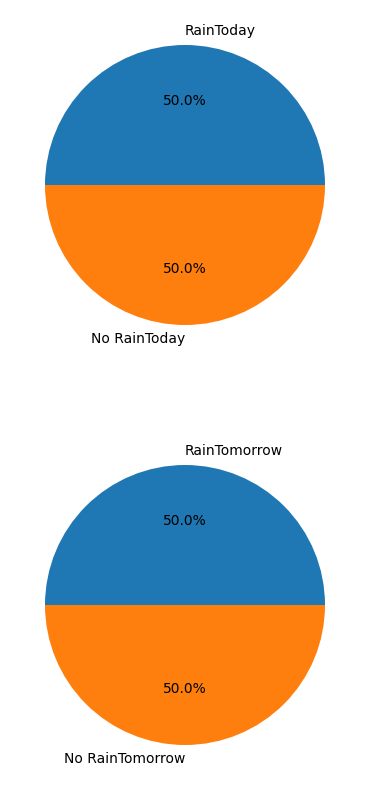

In [36]:
rain_today_ds_logistic.smote_ds(inplace=True)
rain_tomorrow_ds_logistic.smote_ds(inplace=True)
fig, axs = plt.subplots(2, figsize=(10,10) )
axs[0].pie(rain_today_ds_logistic.y_train.value_counts(), labels=["RainToday", "No RainToday"], autopct='%1.1f%%')
axs[1].pie(rain_tomorrow_ds_logistic.y_train.value_counts(), labels=["RainTomorrow", "No RainTomorrow"], autopct='%1.1f%%' )



# Regresiones Lineales
---

## Regresion lineal
---

In [67]:
def linearRegressionModel(x_train, y_train, x_test, y_test):
    model = LinearRegression()
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)


    r2 = r2_score(y_test,y_pred)
    m_e2 = mean_squared_error(y_test, y_pred)
    print (f"score R2: {round(r2, 4)}")
    print (f"error MSE: {round(m_e2, 4)}") 
    return y_pred, r2, m_e2, model

def plot_linear_regression(y_test, y_pred, title=""):
    plt.scatter(y_test, y_test ,  label='True', color='blue')
    plt.scatter(y_pred, y_pred ,  label='Predicted', color='orange')
    plt.legend()
    plt.title(title)
    plt.show()

## Regresion Lineal - Rainfall
---


score R2: 0.1525
error MSE: 0.9337


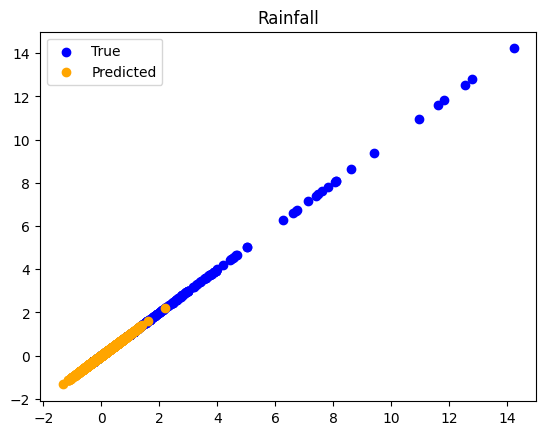

In [68]:
lr = linearRegressionModel(rainfall_ds_linear.x_train, rainfall_ds_linear.y_train, rainfall_ds_linear.x_test, rainfall_ds_linear.y_test)
plot_linear_regression(rainfall_ds_linear.y_test, lr[0], title="Rainfall")


## Regresion Lineal RainfallTomorrow
---

score R2: 0.2347
error MSE: 0.5884


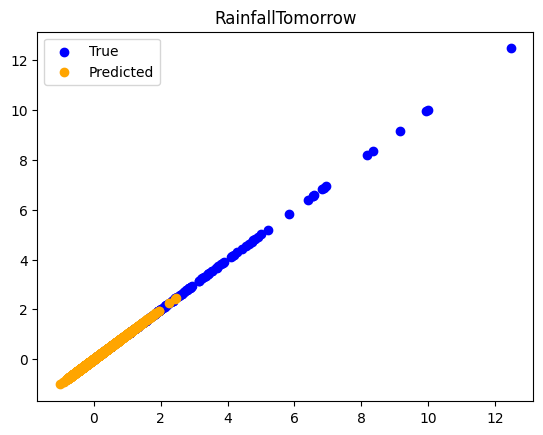

In [69]:
lr = linearRegressionModel(rainfall_tomorrow_ds_linear.x_train, rainfall_tomorrow_ds_linear.y_train, rainfall_tomorrow_ds_linear.x_test, rainfall_tomorrow_ds_linear.y_test)
plot_linear_regression(rainfall_tomorrow_ds_linear.y_test, lr[0], title="RainfallTomorrow")

<p> Vemos que el modelo no da buen resultado para las regresiones lineales, no se ajusta lo suficientemente bien para poder realizar prediciones correctas. </p>
<p> Existe la presencia de muchos outliers ya que hay dias de abundante lluvia pero la mayoria del ano no llueve, por lo que hace muy dificil ajustar un modelo lineal a los datos </p>

In [40]:
from typing import Literal
from sklearn.linear_model import Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV

def linearModelsRegressors(x,y, model: Literal[
    "lasso",
    "lassoCV",
    "elastic",
    "elasticCV",
    "ridge",
    "ridgeCV"
    ], ratios = [], alphas = []):

    models = {
        "lasso": Lasso,
        "lassoCV": LassoCV,
        "elastic": ElasticNet,
        "elasticCV": ElasticNetCV,
        "ridge": Ridge,
        "ridgeCV": RidgeCV
    }

    scores = []

    if model in ["elasticCV", "lassoCV", "ridgeCV"]:
        m = models[model]()
        m.fit(x,y)
        scores.append( (m.alpha_, m.score(x,y)) )

    if model == "elastic":
        meta_vals = zip(alphas, ratios)
        for alpha, ratio in meta_vals:
            m = models[model](alpha=alpha, l1_ratio=ratio)
            m.fit(x,y)
            scores.append( (alpha, ratio, m.score(x,y)) )

    if model in ["ridge", "lasso"]:
        for alpha in alphas:
            m = models[ model ](alpha=alpha)
            m.fit(x,y)
            scores.append( (alpha, m.score(x,y)) )


    for score in scores:
        print(f"{model}")
        print("-----------------")
        print(score)
        print("-----------------")
    return scores

## Regresion de Lasso
---

In [41]:

lasso_result = linearModelsRegressors (model="lasso", alphas=[0.1, 0.01, 0.001, 0.0001], x=rainfall_ds_linear.x_train, y=rainfall_ds_linear.y_train)


lasso
-----------------
(0.1, 0.09194959095955157)
-----------------
lasso
-----------------
(0.01, 0.1649782375117591)
-----------------
lasso
-----------------
(0.001, 0.17268377074595032)
-----------------
lasso
-----------------
(0.0001, 0.17301715260574557)
-----------------


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.664e+01, tolerance: 1.077e+00
  model = cd_fast.enet_coordinate_descent(


In [42]:
lasso_result = linearModelsRegressors (model="lasso", alphas=[0.1, 0.01, 0.001, 0.0001], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)


lasso
-----------------
(0.1, 0.1754019433779731)
-----------------
lasso
-----------------
(0.01, 0.23475740066967643)
-----------------
lasso
-----------------
(0.001, 0.2466292826452886)
-----------------
lasso
-----------------
(0.0001, 0.2470275863110316)
-----------------


## Regresion Ridge
---

In [43]:
ridge_result = linearModelsRegressors (model="ridge", alphas=[0.1, 0.01, 0.001, 0.0001], x=rainfall_ds_linear.x_train, y=rainfall_ds_linear.y_train)

ridge
-----------------
(0.1, 0.17309255433531034)
-----------------
ridge
-----------------
(0.01, 0.17309265118249006)
-----------------
ridge
-----------------
(0.001, 0.17309265221341907)
-----------------
ridge
-----------------
(0.0001, 0.1730926522237941)
-----------------


In [44]:
ridge_result = linearModelsRegressors (model="ridge", alphas=[0.1, 0.01, 0.001, 0.0001], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

ridge
-----------------
(0.1, 0.24704385747962598)
-----------------
ridge
-----------------
(0.01, 0.2470438659282962)
-----------------
ridge
-----------------
(0.001, 0.2470438660161981)
-----------------
ridge
-----------------
(0.0001, 0.24704386601708073)
-----------------


Regresion ElasticNet
---

In [45]:
elastinet_result = linearModelsRegressors (model="elastic", alphas=[0.1, 0.01, 0.001, 0.0001], ratios=[0.1, 0.3, 0.5, 0.7, 0.9], x=rainfall_ds_linear.x_train, y=rainfall_ds_linear.y_train)

elastic
-----------------
(0.1, 0.1, 0.1614816023203024)
-----------------
elastic
-----------------
(0.01, 0.3, 0.17085024711239583)
-----------------
elastic
-----------------
(0.001, 0.5, 0.1728926043224056)
-----------------
elastic
-----------------
(0.0001, 0.7, 0.17302425668374732)
-----------------


In [46]:
elastinet_result = linearModelsRegressors (model="elastic", alphas=[0.1, 0.01, 0.001, 0.0001], ratios=[0.1, 0.3, 0.5, 0.7, 0.9], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

elastic
-----------------
(0.1, 0.1, 0.22619389990891214)
-----------------
elastic
-----------------
(0.01, 0.3, 0.24362474606033635)
-----------------
elastic
-----------------
(0.001, 0.5, 0.24675814668198248)
-----------------
elastic
-----------------
(0.0001, 0.7, 0.24703354784648535)
-----------------


## Cross Validation 
---

### Lasso CV
---

In [47]:
lasocv_result = linearModelsRegressors (model="lassoCV", x=rainfall_ds_linear.x_train, y=rainfall_ds_linear.y_train)
lasocv_result_rt = linearModelsRegressors (model="lassoCV", x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


lassoCV
-----------------
(0.00025184382772276736, 0.17298819423203082)
-----------------


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


lassoCV
-----------------
(0.000796176631096279, 0.24670921964901404)
-----------------


### RidgeCV
---

In [48]:
ridgecv_result = linearModelsRegressors (model="ridgeCV", x=rainfall_ds_linear.x_train, y=rainfall_ds_linear.y_train)
ridgecv_result_rt = linearModelsRegressors (model="ridgeCV", x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

ridgeCV
-----------------
(10.0, 0.1730302534875776)
-----------------
ridgeCV
-----------------
(10.0, 0.24701471907786898)
-----------------


### ElasticNet CV
---

In [49]:
elastinetcv_result = linearModelsRegressors (model="elasticCV", x=rainfall_ds_linear.x_train, y=rainfall_ds_linear.y_train)
elastinetcv_result_rt = linearModelsRegressors (model="elasticCV", x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


elasticCV
-----------------
(0.0005036876554455347, 0.17298083586155977)
-----------------


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


elasticCV
-----------------
(0.0014850339817411918, 0.24666598006433194)
-----------------


# Conclusion Regresion Lineal
---

<p> Ninguno de los modelos se ajusta adecuadamente a los datos. </p>
<p> Como se esperaba por medio del analisis analitico previamente realizado, los datos no pueden ajustarse bien a modelos lineales para predecir cuanta lluvia va a caer.</p>

# Regresion Logistica
---

### Regresion Logistica Rain Today
---

In [50]:
logmodel_rain_today = LogisticRegression(random_state=42, max_iter=1000)
logmodel_rain_today.fit(rain_today_ds_logistic.x_train, rain_today_ds_logistic.y_train)
y_pred_today = logmodel_rain_today.predict(rain_today_ds_logistic.x_test)
print(confusion_matrix(rain_today_ds_logistic.y_test, y_pred_today))
print(classification_report(rain_today_ds_logistic.y_test, y_pred_today))

[[1600  469]
 [ 164  460]]
              precision    recall  f1-score   support

           0       0.91      0.77      0.83      2069
           1       0.50      0.74      0.59       624

    accuracy                           0.76      2693
   macro avg       0.70      0.76      0.71      2693
weighted avg       0.81      0.76      0.78      2693



### Regresion Logistica Rain Tomorrow
---

In [51]:
logmodel_rain_tomorrow = LogisticRegression(random_state=42, max_iter=1000)
logmodel_rain_tomorrow.fit(rain_tomorrow_ds_logistic.x_train, rain_tomorrow_ds_logistic.y_train)
y_pred_tomorrow = logmodel_rain_tomorrow.predict(rain_tomorrow_ds_logistic.x_test)
print(confusion_matrix(rain_tomorrow_ds_logistic.y_test, y_pred_tomorrow))
print(classification_report(rain_tomorrow_ds_logistic.y_test, y_pred_tomorrow))

[[1682  398]
 [ 150  463]]
              precision    recall  f1-score   support

           0       0.92      0.81      0.86      2080
           1       0.54      0.76      0.63       613

    accuracy                           0.80      2693
   macro avg       0.73      0.78      0.74      2693
weighted avg       0.83      0.80      0.81      2693



## ROC-AUC
---



In [52]:
from sklearn.metrics import roc_auc_score, roc_curve

def plot_roc_curve(true_y, y_prob):
    fpr, tpr, thresholds = roc_curve(true_y, y_prob)
    plt.plot(fpr, tpr)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')

RainToday : 0.7552499659193714
RainTomorrow : 0.7819778203036767


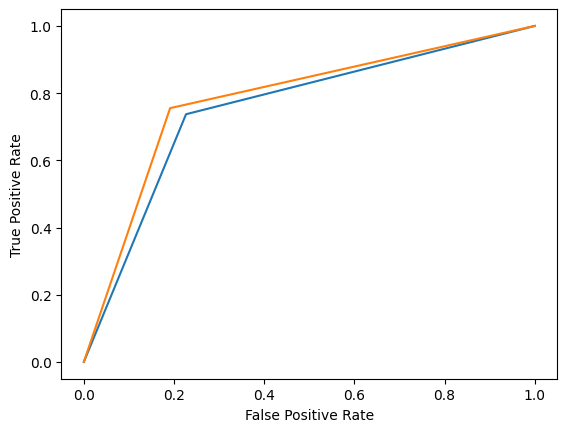

In [53]:
plot_roc_curve(rain_today_ds_logistic.y_test, y_pred_today)
plot_roc_curve(rain_tomorrow_ds_logistic.y_test, y_pred_tomorrow)
print(f"RainToday : {roc_auc_score(rain_today_ds_logistic.y_test, y_pred_today)}")
print(f"RainTomorrow : {roc_auc_score(rain_tomorrow_ds_logistic.y_test, y_pred_tomorrow)}")

## Shap sobre la Regresion Logistica
---


In [54]:
import shap
#shap.initjs()

rain_today_features = rain_today_ds_logistic.df.columns.drop("RainToday")
explainer_log = shap.Explainer(logmodel_rain_today, rain_today_ds_logistic.x_train, feature_names=rain_today_features)
shap_log = explainer_log.shap_values(rain_today_ds_logistic.x_test)
shap_values_log = explainer_log(rain_today_ds_logistic.x_test)
index = 0
explanation_log = shap.Explanation(values=shap_log[index], base_values=explainer_log.expected_value, feature_names=rain_today_features)

### Shap sobre RainToday
---

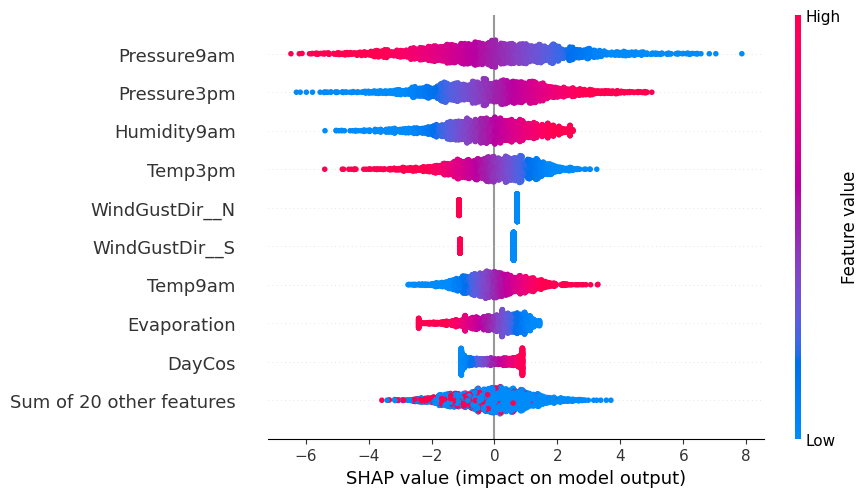

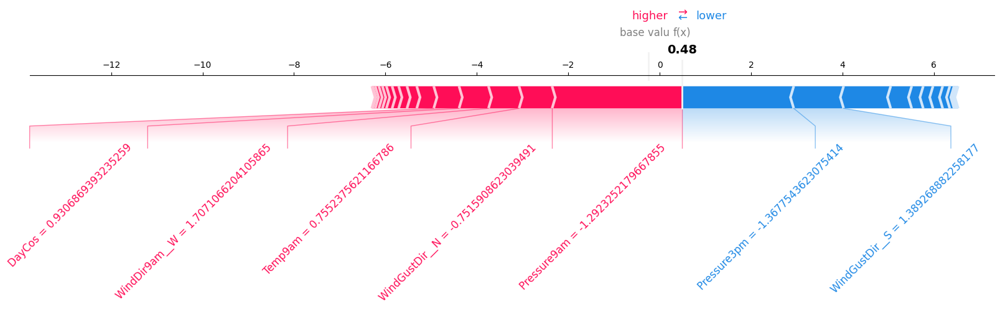

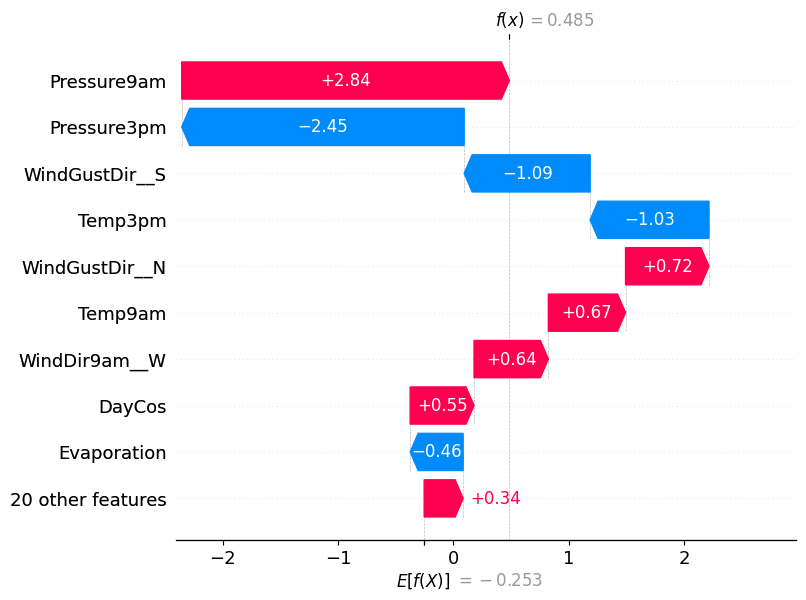

In [55]:
shap.plots.beeswarm(shap_values_log)
shap.plots.force(shap_values_log[0:100], feature_names=rain_today_features)
shap.force_plot(explainer_log.expected_value, explanation_log.values, rain_today_ds_logistic.x_test[0], text_rotation=45, feature_names=rain_today_features, matplotlib=True)
shap.plots.waterfall(explanation_log)

### Sharp sobre RainTomorrow
---

In [56]:
rain_tomorrow_features = rain_tomorrow_ds_logistic.df.columns.drop("RainTomorrow")
explainer_log = shap.Explainer(logmodel_rain_tomorrow, rain_tomorrow_ds_logistic.x_train, feature_names=rain_tomorrow_features)
shap_log = explainer_log.shap_values(rain_tomorrow_ds_logistic.x_test)
shap_values_log = explainer_log(rain_tomorrow_ds_logistic.x_test)
index = 0
explanation_log = shap.Explanation(values=shap_log[index], base_values=explainer_log.expected_value, feature_names=rain_tomorrow_features)

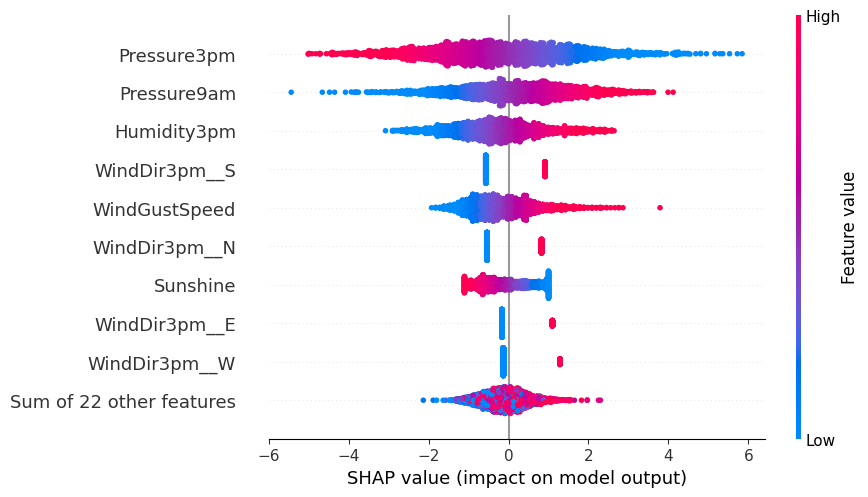

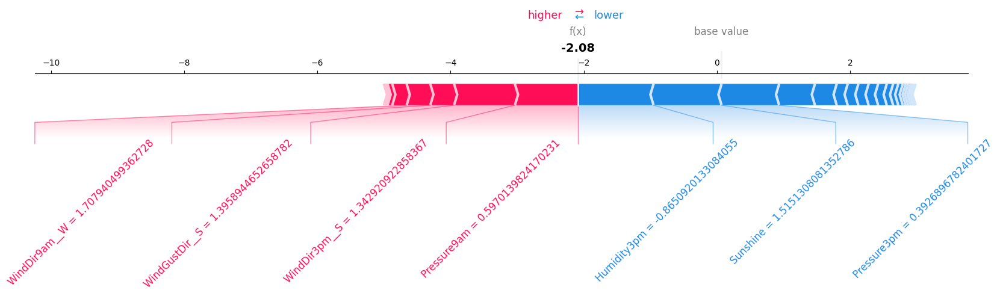

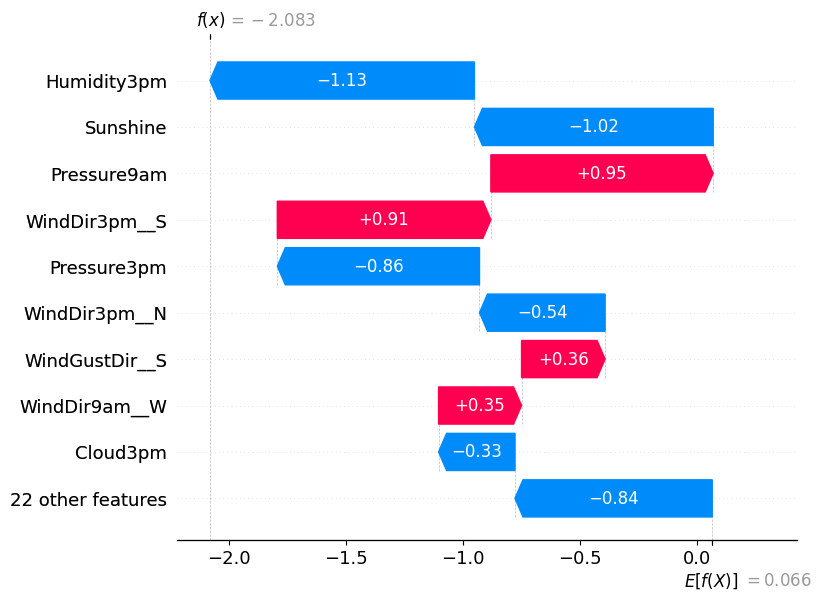

In [57]:
shap.plots.beeswarm(shap_values_log)
shap.plots.force(shap_values_log[0:100], feature_names=rain_tomorrow_features)
shap.force_plot(explainer_log.expected_value, explanation_log.values, rain_tomorrow_ds_logistic.x_test[0], text_rotation=45, feature_names=rain_tomorrow_features, matplotlib=True)
shap.plots.waterfall(explanation_log)

## Conclusion Shap sobre regresion logistica
---

# Redes neuronales
---

In [58]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras.models import clone_model
import optuna

tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

def target_class(trial: optuna.trial.Trial , x_train, y_train, x_test, y_test):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer_{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=10, batch_size=32)
    score = model.evaluate(x_test, y_test, verbose=0)
    return score[1]

2024-02-05 12:51:23.684446: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-05 12:51:23.684470: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-05 12:51:23.685133: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-05 12:51:23.689014: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-05 12:51:24.368229: W tensorflow/compiler/tf2

### Optuna
---
Se define una función objetivo para poder encontrar los mejores hiperparámetros para el modelo. Luego, se utiliza *optuna* para maximizar la función

In [59]:
study = optuna.create_study(direction="maximize")
study.optimize( 
    lambda trial: target_class(
        trial, 
        x_train=rain_today_ds_logistic.x_train, 
        y_train=rain_today_ds_logistic.y_train, 
        x_test=rain_today_ds_logistic.x_test, 
        y_test=rain_today_ds_logistic.y_test
    ), 
    n_trials=1
)

[I 2024-02-05 12:51:24,974] A new study created in memory with name: no-name-00952c15-33a2-48fd-aac6-5adfc8bf900a
2024-02-05 12:51:25.011456: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-05 12:51:25.012328: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-05 12:51:25.012434: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUM

Epoch 1/10


2024-02-05 12:51:25.278654: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


517/517 [==============================] - 15s 28ms/step - loss: 0.4696 - accuracy: 0.7763 - val_loss: 0.4664 - val_accuracy: 0.7653
Epoch 2/10
517/517 [==============================] - 15s 29ms/step - loss: 0.3987 - accuracy: 0.8189 - val_loss: 0.4527 - val_accuracy: 0.7653
Epoch 3/10
517/517 [==============================] - 15s 29ms/step - loss: 0.3652 - accuracy: 0.8376 - val_loss: 0.4392 - val_accuracy: 0.7917
Epoch 4/10
517/517 [==============================] - 15s 29ms/step - loss: 0.3397 - accuracy: 0.8543 - val_loss: 0.4925 - val_accuracy: 0.7690
Epoch 5/10
517/517 [==============================] - 15s 29ms/step - loss: 0.3169 - accuracy: 0.8645 - val_loss: 0.4916 - val_accuracy: 0.7794
Epoch 6/10
517/517 [==============================] - 15s 28ms/step - loss: 0.2944 - accuracy: 0.8766 - val_loss: 0.4838 - val_accuracy: 0.8047
Epoch 7/10
517/517 [==============================] - 15s 28ms/step - loss: 0.2714 - accuracy: 0.8883 - val_loss: 0.5075 - val_accuracy: 0.7984
Epo

[I 2024-02-05 12:53:55,030] Trial 0 finished with value: 0.8202747702598572 and parameters: {'num_layers': 4, 'n_units_layer_0': 76, 'n_units_layer_1': 175, 'n_units_layer_2': 66, 'n_units_layer_3': 44}. Best is trial 0 with value: 0.8202747702598572.


In [60]:
print( study.best_params )
print( study.best_value )

{'num_layers': 4, 'n_units_layer_0': 76, 'n_units_layer_1': 175, 'n_units_layer_2': 66, 'n_units_layer_3': 44}
0.8202747702598572


Los mejores parámetros para nuestro modelo:
* num_layers: 1
* Neuronas en capa 1: 123

<br>
Score: 0.81

# Creacion del Modelo
---


In [61]:
model_reg = Sequential()
model_reg.add(Input(shape=[len(rain_today_features), ]))
model_reg.add(Dense(143, activation="relu"))
model_reg.add(Dense(143, activation="relu"))
model_reg.add(Dense(1, activation="sigmoid"))
model_reg.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
history_reg = model_reg.fit(rain_today_ds_logistic.x_train, rain_today_ds_logistic.y_train, validation_data=(rain_today_ds_logistic.x_test, rain_today_ds_logistic.y_test), epochs=10)

Epoch 1/10
517/517 [==============================] - 11s 21ms/step - loss: 0.4562 - accuracy: 0.7817 - val_loss: 0.4545 - val_accuracy: 0.7739
Epoch 2/10
517/517 [==============================] - 11s 21ms/step - loss: 0.3998 - accuracy: 0.8186 - val_loss: 0.4216 - val_accuracy: 0.8047
Epoch 3/10
517/517 [==============================] - 11s 21ms/step - loss: 0.3720 - accuracy: 0.8356 - val_loss: 0.4723 - val_accuracy: 0.7724
Epoch 4/10
517/517 [==============================] - 11s 21ms/step - loss: 0.3527 - accuracy: 0.8464 - val_loss: 0.4372 - val_accuracy: 0.7954
Epoch 5/10
517/517 [==============================] - 11s 21ms/step - loss: 0.3363 - accuracy: 0.8544 - val_loss: 0.4361 - val_accuracy: 0.8006
Epoch 6/10
517/517 [==============================] - 11s 21ms/step - loss: 0.3190 - accuracy: 0.8671 - val_loss: 0.4439 - val_accuracy: 0.8010
Epoch 7/10
517/517 [==============================] - 11s 22ms/step - loss: 0.3048 - accuracy: 0.8720 - val_loss: 0.4475 - val_accuracy:

85/85 [==============================] - 1s 7ms/step - loss: 0.4606 - accuracy: 0.8065


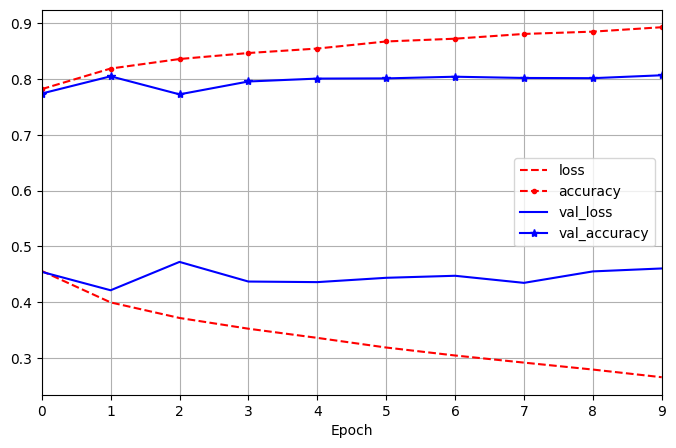

In [62]:
model_reg.evaluate(rain_today_ds_logistic.x_test, rain_today_ds_logistic.y_test)
pd.DataFrame(history_reg.history).plot(figsize=(8, 5), xlim=[0, 9],  grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

# Creacion del modelo lineal
---

In [63]:
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Abs Error [MPG]')
  plt.plot(hist['epoch'], hist['mae'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mae'],
           label = 'Val Error')
  plt.ylim([0,5])
  plt.legend()

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Square Error [$MPG^2$]')
  plt.plot(hist['epoch'], hist['mse'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mse'],
           label = 'Val Error')
  plt.ylim([0,20])
  plt.legend()
  plt.show()

In [64]:
model_linear = Sequential()

rainfall_feature=rainfall_ds_linear.df.columns.drop("Rainfall")

model_linear.add(Input(shape=[len(rainfall_feature), ]))
model_linear.add(Dense(127, activation="relu"))
model_linear.add(Dense(168, activation="relu"))
model_linear.add(Dense(1))
model_linear.compile(optimizer="adam", loss="mean_squared_error", metrics=['mae', 'mse'])
history_linear = model_linear.fit(rainfall_ds_linear.x_train, rainfall_ds_linear.y_train, validation_data=(rainfall_ds_linear.x_test, rainfall_ds_linear.y_test), epochs=10)

Epoch 1/10
337/337 [==============================] - 7s 22ms/step - loss: 0.8047 - mae: 0.4233 - mse: 0.8047 - val_loss: 0.8127 - val_mae: 0.4163 - val_mse: 0.8127
Epoch 2/10
337/337 [==============================] - 7s 22ms/step - loss: 0.7184 - mae: 0.3860 - mse: 0.7184 - val_loss: 0.7870 - val_mae: 0.3736 - val_mse: 0.7870
Epoch 3/10
337/337 [==============================] - 7s 22ms/step - loss: 0.6805 - mae: 0.3681 - mse: 0.6805 - val_loss: 0.8081 - val_mae: 0.3987 - val_mse: 0.8081
Epoch 4/10
337/337 [==============================] - 7s 21ms/step - loss: 0.6582 - mae: 0.3630 - mse: 0.6582 - val_loss: 0.7841 - val_mae: 0.3711 - val_mse: 0.7841
Epoch 5/10
337/337 [==============================] - 7s 22ms/step - loss: 0.6412 - mae: 0.3538 - mse: 0.6412 - val_loss: 0.7658 - val_mae: 0.3625 - val_mse: 0.7658
Epoch 6/10
337/337 [==============================] - 7s 21ms/step - loss: 0.6115 - mae: 0.3441 - mse: 0.6115 - val_loss: 0.7459 - val_mae: 0.3609 - val_mse: 0.7459
Epoch 7/10

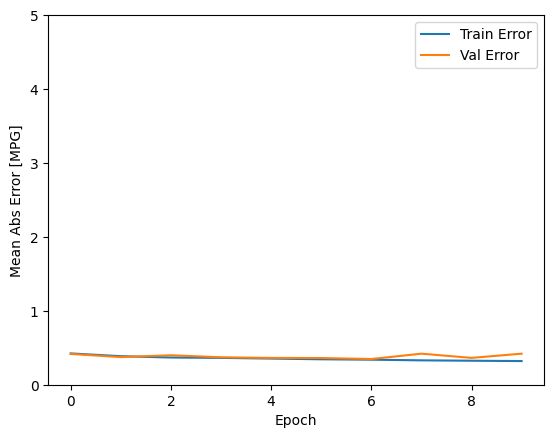

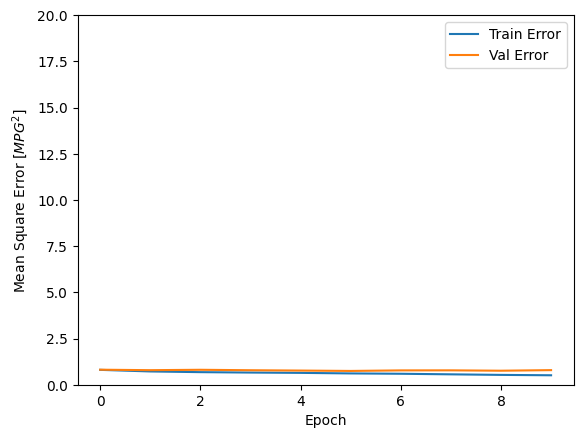

In [65]:
plot_history(history_linear)

# Conclusión Final
---

Durante este proyecto, exploramos y desarrollamos múltiples modelos para predecir la lluvia basándonos en diversas características. Comenzamos abordando la integridad de nuestros datos al completar los valores faltantes, asegurándonos de mantener la calidad de nuestro conjunto de datos para su análisis.

Para nuestros modelos de regresión, experimentamos con varios enfoques, incluyendo regresión lineal clásica, Ridge, Lasso y Elastic Net. Observamos cómo cada uno maneja la regularización y la complejidad del modelo, lo que nos permitió seleccionar el enfoque más adecuado para nuestro problema. Sin embargo, nunca logramos obtener un buen modelo de regresión lineal.

Además, para lidiar con el desbalance en los datos, aplicamos técnicas de balanceo en nuestro conjunto de datos, lo que mejoró significativamente el rendimiento y la generalización de nuestros modelos.

Exploramos modelos más avanzados, incluyendo redes neuronales tanto para regresión como para clasificación, utilizando TensorFlow y Keras. Estos modelos demostraron una gran capacidad para capturar relaciones no lineales y patrones complejos en los datos, aunque requirieron una mayor complejidad de ajuste pero se pudo lograr un modelo de prediccion aceptable.

Analizamos los modelos con Shap para generar gráficos explicativos.

Finalmente, integramos todos nuestros modelos en una pipeline para una implementación más sencilla y usamos Streamlit para llevar nuestro proyecto a producción. Esta herramienta nos permitió crear una interfaz interactiva y amigable que ofrece nuestras predicciones a los usuarios finales.

# Exportacion del modelo
---

In [66]:
import joblib
from sklearn.pipeline import Pipeline

pipeline_clas ={
    "columns": rain_today_ds_logistic.df.columns.drop("RainToday"),
    "pipeline": Pipeline([
        ("preprocessor", rain_today_ds_logistic.scaler),
        ('logistic_regression',model_reg)
    ])
} 

pipeline_reg = {
    "columns": 
}

joblib.dump(pipeline_clas, 'models/clas.pkl')


['models/rain.pkl']